In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import bs4

# Highland Park

In [2]:
# code by Audrey 
def getPosts(neighborhood, howmany):
    postList = []
    n = neighborhood.replace(' ', '%20')
    
    # range 0 (1st page) - number of posts you want, going up in 120 increments 
    ## looping over the pages until you reach the target HOWMANY posts 
    for i in range(0, howmany, 120): 
    #FOR EACH PAGE: 
        url = f'https://losangeles.craigslist.org/d/housing/search/hhh?s={i}&query=' + n      
        #request the text from the url 
        r =requests.get(url)
        soup = BeautifulSoup(r.content)
        
        #get a list of posts 
        posts = soup.find_all('li', class_ = 'result-row')
        
        #FOR EACH POST 
        for post in posts:
            #store temporary variables 
            price = post.find('span', class_ = 'result-price')
            if price is not None: 
                price = price.text
            
            #break down housingsize into BR and SF 
            housingsize = post.find('span', class_ ='housing')
            bedrooms = None 
            sqft = None
            if housingsize is not None:
                housingsize = housingsize.text
                hlist = housingsize.split()
                
                for h in hlist:
                    if 'br' in h:
                        bedrooms = int(h.replace('br', ''))
                    if 'ft2' in h:
                        sqft = int(h.replace('ft2', ''))
                
            
            neighborhood = post.find('span', class_='result-hood')
            if neighborhood is not None: 
                neighborhood = neighborhood.text
                
            title = post.find('a', class_='result-title')
            if title is not None:
                title = title.text
            
            #go into the individual post's url and get the description...
            url_post = post.find('a', class_='result-title')['href']
            r_post = requests.get(url_post)
            soup_post = BeautifulSoup(r_post.content)
            description = soup_post.find('section', id="postingbody")
            
#             if "no parking" in soup_post.text.lower():
#                 noparking = True
#             elif "parking" in soup_object.text.lower():
#                 noparking = False
#             else:
#                 noparking = True
            
            latlon = soup_post.find('div', class_='viewposting')
            if latlon is not None:
                latitude = latlon['data-latitude']
                longitude = latlon['data-longitude']
            
            postList.append({'Post Title':title, 'Description':description, 'Neighborhood':neighborhood,'Price': price, 'No. Beds':bedrooms, 'SF':sqft, 'URL':url_post, 'lat': latitude, 'lon': longitude})
        
        df = pd.DataFrame(postList)
        
    return df

In [3]:
# call the function for posts in Highland Park
highland_park = getPosts('Highland Park', 1000)

In [4]:
# how big is the df
highland_park.shape

(679, 9)

In [5]:
# lets take a look at it 
highland_park.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,1 br + den - Live in Highland Park - Remodeled...,"[\n, [\n, [QR Code Link to This Post], \n, [],...","(Highland Park, So Pasadena, Eagle Rock)","$1,950",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.103869,-118.200808
1,PRICE REDUCED - Highland Park - Remodeled & Sp...,"[\n, [\n, [QR Code Link to This Post], \n, [],...","(Highland Park, So Pasadena, Eagle Rock)","$1,950",2.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.104011,-118.200851
2,Unique 2 Bedroom 2 Bath Apartment near Highlan...,"[\n, [\n, [QR Code Link to This Post], \n, [],...","(Los Angeles, Highland Park, South Pasadena)","$2,004",2.0,830.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.113208,-118.177105
3,"Renovated 1 Bedroom in Highland Park, Wood Sty...","[\n, [\n, [QR Code Link to This Post], \n, [],...",(Highland Park 90042),"$1,965",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405
4,"1 Bed 1 Bath in Highland Park, Pet-Friendly, R...","[\n, [\n, [QR Code Link to This Post], \n, [],...",None,"$1,965",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.110908,-118.192405


In [10]:
# the description looks weird in the df so lets print one's description out
highland_park.loc[0]['Description']

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-highland-park-bedroom-ba/7316484909.html"></div>
</div>
315 South Avenue 55<br/>
Highland Park, CA<br/>
90042<br/>
<br/>
<a class="show-contact" data-href="/reply/lax/apa/7316484909/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show contact info</a>
<br/>
<br/>
<br/>
315 SOUTH AVENUE AMENITIES<br/>
- Air Conditioning, Refrigerator, Hardwood Style Floors Throughout, Disposal, Ceiling Fan, Microwave, Gas Range, Stainless Steel Appliances, Dishwasher &amp; Laundry On-site<br/>
<br/>
<br/>
<br/>
PET POLICY<br/>
Cats and Dogs Allowed. <br/>
Additional Fees and Deposit May Apply. <br/>
Call for Details and Restrictions.<br/>
<br/>
<br/>
<br/>
Sq Footage Is Approximate. Price and availability are subject to change.<br/>
<br/>
<br

In [11]:
# lets try the function but for 500 posts only 
hpark_500 = getPosts('Highland Park', 500)
hpark_500.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,HIGHLAND PARK 1 Bedroom 1 BA - Stainless Steel...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(Highland Park),"$1,850",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.103609,-118.194491
1,1BD/1BA in Highland Park!,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(Los Angeles),"$1,950",1.0,600.0,https://losangeles.craigslist.org/wst/apa/d/do...,33.921800,-118.139500
2,(HIGHLAND PARK AREA) COMING UP! LOVELY 1 BEDRO...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(6447 Figueroa St),"$1,700",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.118835,-118.183746
3,Hardwood Style Floors * Stainless Steel Appls ...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(Highland Park),"$1,850",1.0,NaN,https://losangeles.craigslist.org/lac/apa/d/lo...,34.103609,-118.194491
4,Fun Studio Apartment near Highland Park! 440 s...,"[\n, [\n, [QR Code Link to This Post], \n, [],...","(Los Angeles, Highland Park, South Pasadena)","$1,606",NaN,440.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.113208,-118.177105


In [12]:
# it looks like since craiglist pages are by the 120, it pulls the entire page for which the 500th post is on
hpark_500.shape

(600, 9)

In [13]:
type(highland_park)

pandas.core.frame.DataFrame

In [6]:
# import libraries for NLP analysis
import PyPDF2
import re

In [7]:
# we want to get the description column into a list form
hpark_list = highland_park["Description"].tolist()
hpark_list

[<section id="postingbody">
 <div class="print-information print-qrcode-container">
 <p class="print-qrcode-label">QR Code Link to This Post</p>
 <div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-br-den-live-in-highland/7319206417.html"></div>
 </div>
 Large unit with open kitchen, living room, dining room. <br/>
 New hardwood flooring thru-out. Walk-in closet. A/C and ceiling fan.<br/>
 New kitchen countertops and sink. Stove, refrigerator, and microwave available.<br/>
 Newly remodeled bathroom with new tiles, bathtub, vanity, and flooring.<br/>
 Newly painted unit. <br/>
 <br/>
 2 free covered parking spaces. Laundry on-site. Gated access.<br/>
 Walking distance to Metro Rail, bus stops, supermarket, shops, restaurants.<br/>
 Minutes to freeways and Downtown LA.<br/>
 <br/>
 Easy showing. Call or text "AL" at  <a class="show-contact" data-href="/reply/lax/apa/7319206417/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contac

In [16]:
# Found code that is supposed to print the list into a string, but it only prints the first description for some reason 
def listToString(hpark_list): 
    str1 = " " 
    for string in hpark_list: 
        return(string.get_text(' ', strip=True))

print(listToString(hpark_list))

QR Code Link to This Post 315 South Avenue 55 Highland Park, CA 90042 show contact info 315 SOUTH AVENUE AMENITIES - Air Conditioning, Refrigerator, Hardwood Style Floors Throughout, Disposal, Ceiling Fan, Microwave, Gas Range, Stainless Steel Appliances, Dishwasher & Laundry On-site PET POLICY Cats and Dogs Allowed. Additional Fees and Deposit May Apply. Call for Details and Restrictions. Sq Footage Is Approximate. Price and availability are subject to change.


In [8]:
# turn the list into a string
hpark_str = highland_park.Description.apply(str)

In [9]:
# bring it back into a list
hpark_str = hpark_str.tolist()
hpark_str

['<section id="postingbody">\n<div class="print-information print-qrcode-container">\n<p class="print-qrcode-label">QR Code Link to This Post</p>\n<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-br-den-live-in-highland/7319206417.html"></div>\n</div>\nLarge unit with open kitchen, living room, dining room. <br/>\nNew hardwood flooring thru-out. Walk-in closet. A/C and ceiling fan.<br/>\nNew kitchen countertops and sink. Stove, refrigerator, and microwave available.<br/>\nNewly remodeled bathroom with new tiles, bathtub, vanity, and flooring.<br/>\nNewly painted unit. <br/>\n<br/>\n2 free covered parking spaces. Laundry on-site. Gated access.<br/>\nWalking distance to Metro Rail, bus stops, supermarket, shops, restaurants.<br/>\nMinutes to freeways and Downtown LA.<br/>\n<br/>\nEasy showing. Call or text "AL" at  <a class="show-contact" data-href="/reply/lax/apa/7319206417/__SERVICE_ID__" href="#" rel="nofollow" title="click to show conta

In [10]:
# lets get rid of extra whitespace
hpark_text = re.sub(r"\s+", " ", str(hpark_str))

In [11]:
# what does it look like
hpark_text

'[\'<section id="postingbody">\\n<div class="print-information print-qrcode-container">\\n<p class="print-qrcode-label">QR Code Link to This Post</p>\\n<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-br-den-live-in-highland/7319206417.html"></div>\\n</div>\\nLarge unit with open kitchen, living room, dining room. <br/>\\nNew hardwood flooring thru-out. Walk-in closet. A/C and ceiling fan.<br/>\\nNew kitchen countertops and sink. Stove, refrigerator, and microwave available.<br/>\\nNewly remodeled bathroom with new tiles, bathtub, vanity, and flooring.<br/>\\nNewly painted unit. <br/>\\n<br/>\\n2 free covered parking spaces. Laundry on-site. Gated access.<br/>\\nWalking distance to Metro Rail, bus stops, supermarket, shops, restaurants.<br/>\\nMinutes to freeways and Downtown LA.<br/>\\n<br/>\\nEasy showing. Call or text "AL" at <a class="show-contact" data-href="/reply/lax/apa/7319206417/__SERVICE_ID__" href="#" rel="nofollow" title="cli

In [12]:
# turn it back into a string
hpark_str = str(hpark_str)

In [13]:
# check the data type
type(hpark_text)

str

In [14]:
# check the data type
type(hpark_list)

list

In [15]:
# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines = []                              # Declare an empty list
for line in hpark_list:                   # For each line of text,
    mylines.append(line)              # add that line to the list.
for element in mylines:               # For each element in the list,
    print(element)

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-br-den-live-in-highland/7319206417.html"></div>
</div>
Large unit with open kitchen, living room, dining room. <br/>
New hardwood flooring thru-out. Walk-in closet. A/C and ceiling fan.<br/>
New kitchen countertops and sink. Stove, refrigerator, and microwave available.<br/>
Newly remodeled bathroom with new tiles, bathtub, vanity, and flooring.<br/>
Newly painted unit. <br/>
<br/>
2 free covered parking spaces. Laundry on-site. Gated access.<br/>
Walking distance to Metro Rail, bus stops, supermarket, shops, restaurants.<br/>
Minutes to freeways and Downtown LA.<br/>
<br/>
Easy showing. Call or text "AL" at  <a class="show-contact" data-href="/reply/lax/apa/7319206417/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show con

In [16]:
# check data type
type(mylines)

list

In [17]:
# lets remove the white space from this
mylines_text = re.sub(r"\s+", " ", str(mylines))
mylines_text

'[<section id="postingbody"> <div class="print-information print-qrcode-container"> <p class="print-qrcode-label">QR Code Link to This Post</p> <div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-br-den-live-in-highland/7319206417.html"></div> </div> Large unit with open kitchen, living room, dining room. <br/> New hardwood flooring thru-out. Walk-in closet. A/C and ceiling fan.<br/> New kitchen countertops and sink. Stove, refrigerator, and microwave available.<br/> Newly remodeled bathroom with new tiles, bathtub, vanity, and flooring.<br/> Newly painted unit. <br/> <br/> 2 free covered parking spaces. Laundry on-site. Gated access.<br/> Walking distance to Metro Rail, bus stops, supermarket, shops, restaurants.<br/> Minutes to freeways and Downtown LA.<br/> <br/> Easy showing. Call or text "AL" at <a class="show-contact" data-href="/reply/lax/apa/7319206417/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show co

In [18]:
# we want words only
mylines_words = re.sub(r"[^A-z\s]", "", mylines_text)
mylines_words

'[section idpostingbody div classprintinformation printqrcodecontainer p classprintqrcodelabelQR Code Link to This Postp div classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesbrdenliveinhighlandhtmldiv div Large unit with open kitchen living room dining room br New hardwood flooring thruout Walkin closet AC and ceiling fanbr New kitchen countertops and sink Stove refrigerator and microwave availablebr Newly remodeled bathroom with new tiles bathtub vanity and flooringbr Newly painted unit br br  free covered parking spaces Laundry onsite Gated accessbr Walking distance to Metro Rail bus stops supermarket shops restaurantsbr Minutes to freeways and Downtown LAbr br Easy showing Call or text AL at a classshowcontact datahrefreplylaxapa__SERVICE_ID__ href relnofollow titleclick to show contact infoshow contact infoa br Se habla espanol section section idpostingbody div classprintinformation printqrcodecontainer p classprintqrcodelabelQR Code Link to This Postp div 

In [19]:
# now lets create a function that does a word count for the words in the wordsonly df
def countWords(wordlist):
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower() # convert to lowercase
        if lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'
    return df

# create a list of all the words, through splitting on the spaces
wordlist = mylines_words.split()
df = countWords(wordlist)

In [20]:
df.head()

,word_count
word,
and,5869
the,5842
br,5459
to,4215
a,3676


In [21]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/saratohamy/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/saratohamy/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [25]:
swords = stopwords.words('english')
swords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [26]:
# lets add these common meaningless words to the stop words list
swords.append('br')
swords.append('div')
swords.append('la')
swords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [33]:
# lets count lemmatized (root) words
from nltk.stem import PorterStemmer
ps = PorterStemmer()

def count_words(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    swords= [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # this is the extra line
        lword = word.lower()

        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df

df = count_words(wordlist)
df.head(10)

,word_count
word,
br,5459
div,2037
park,2012
district,1772
section,1358
space,1303
contact,1160
city,1066
la,1062


In [34]:
# create a pandas datafram that counts the words and lets us know if its a stop word or not
swords = [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]

df = countWords(wordlist)
df.reset_index(inplace=True) # we want to do an apply on word, so it has to be a regular column, not the index

df['stopword'] = df.word.apply(lambda x: True if x in swords else False)
print(df.head(10))

df = df[df.stopword==False] # filter the dataframe to only be non-stopword words
print(df.head(10))

   word  word_count  stopword
0   and        5869      True
1   the        5842      True
2    br        5459     False
3    to        4215      True
4     a        3676      True
5    of        2625      True
6   for        2339      True
7    is        2134      True
8   div        2037     False
9  park        2012     False
        word  word_count  stopword
2         br        5459     False
8        div        2037     False
9       park        2012     False
13  district        1772     False
17   section        1358     False
18     space        1303     False
19   contact        1160     False
20      city        1066     False
21        la        1062     False
22       san        1035     False


In [37]:
# another way of doing this
# solution
# method 1: modify the function
def countWords_nostop(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    # original code: swords = [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords = stopwords.words('english')
    swords.append('br')
    swords.append('div')
    swords.append('la')
    
    # in longhand, that was
    # swords = []
    # for sword in stopwords.words('english'):
    #     swords.append(re.sub(r"[^A-z\s]", "", sword))
    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower()
        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df

df = countWords_nostop(wordlist)
print(df.head())

          word_count
word                
park            2012
district        1772
section         1358
space           1303
contact         1160


In [38]:
df.head()

,word_count
word,
park,2012
district,1772
section,1358
space,1303
contact,1160


lets see the count for words we think are gentrification "buzz words" 

In [39]:
df = df.reset_index()

In [40]:
# list of code words to pull from the count of words
# code https://stackoverflow.com/questions/36410075/select-rows-from-a-dataframe-based-on-multiple-values-in-a-column-in-pandas
hpark_buzz = df[df['word'].isin(['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten'])]
hpark_buzz

,word,word_count
98,private,284
118,walk,239
172,security,192
279,gated,163
302,restaurants,143
332,modern,122
357,amenities,110
363,bars,106
432,walking,87
519,prime,66


In [ ]:
# lets normalize the data by the number of posts bc we need to have a comparable number across neighborhoods
hpark_buzz['count_per_10posts'] = hpark_buzz['word_count']/len(highland_park)*10
hpark_buzz

# East Hollywood

In [41]:
east_holly = getPosts('East Hollywood', 1000)

In [42]:
east_holly.shape

(766, 9)

In [43]:
east_holly.head()

,Post Title,Description,Neighborhood,Price,No. Beds,SF,URL,lat,lon
0,Remodeled Upstairs Unit with $ 2 Parking Optio...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(East Hollywood),"$1,595",1.0,600.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.094509,-118.290132
1,East Hollywood Remodeled 2 bedroom and 1 bath,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(East Hollywood),"$2,095",2.0,1000.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.089800,-118.321500
2,Berendo Bungalows in East Hollywood! *2 Weeks ...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(Los Angeles),"$1,565",NaN,425.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.090000,-118.294400
3,Renovated East Hollywood Gem! 1BD/1BA with in ...,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(East Hollywood),"$2,295",1.0,850.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088924,-118.303436
4,East Hollywood Spanish Studio Remodeled,"[\n, [\n, [QR Code Link to This Post], \n, [],...",(Los Angeles),"$1,295",NaN,440.0,https://losangeles.craigslist.org/lac/apa/d/lo...,34.088891,-118.302097


In [44]:
# we want to get the description column into a list form
eholly_list = east_holly["Description"].tolist()
eholly_str = east_holly.Description.apply(str)
eholly_text = re.sub(r"\s+", " ", str(eholly_str))
eholly_text

'0 <section id="postingbody">\\n<div class="print-... 1 <section id="postingbody">\\n<div class="print-... 2 <section id="postingbody">\\n<div class="print-... 3 <section id="postingbody">\\n<div class="print-... 4 <section id="postingbody">\\n<div class="print-... ... 761 <section id="postingbody">\\n<div class="print-... 762 <section id="postingbody">\\n<div class="print-... 763 <section id="postingbody">\\n<div class="print-... 764 <section id="postingbody">\\n<div class="print-... 765 <section id="postingbody">\\n<div class="print-... Name: Description, Length: 766, dtype: object'

In [47]:
# found code that breaks each individual line up from the text
# https://www.computerhope.com/issues/ch001721.htm
mylines = []                              # Declare an empty list
for line in eholly_list:                   # For each line of text,
    mylines.append(line)              # add that line to the list.
for element in mylines:               # For each element in the list,
    print(element)

<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-remodeled-upstairs-unit/7319230666.html"></div>
</div>
<h1>Remodeled Upstairs Unit with $ 2 Parking Option in East Hollywood Close to Los Feliz and Silver Lake | Water, Gas, Trash Paid </h1><h2>4641 La Mirada #10, Los Angeles CA 90029</h2><hr/>
<p>This remodeled unit features hardwood flooring, updated kitchen with a stove, dishwasher and fridge. The owner pays for water, trash and gas. Plus, you can rent one parking space for $2 monthly - this isn't a typo! The complex is located between Silverlake and Los Feliz, in the center of it ALL! Only a few minutes to: The Vista Theater, Intelligentsia, Sqirl, Sunset Junction, Kaiser, the Children's Hospital and Metro Red line. Sorry, no pets. Come and make it yours!

</p>
<hr/>
<p><b>LEASE TERMS</b><br/>
One

tags: Hollywood loft, Hollywood apartments, apartments in Hollywood, pet friendly, central heat and air, fireplace, tile floors, stainless steel appliances, fans, granite, balcony, large closets, view, on-site manager, quiet building, parking available, gated parking,    </section>
<section id="postingbody">
<div class="print-information print-qrcode-container">
<p class="print-qrcode-label">QR Code Link to This Post</p>
<div class="print-qrcode" data-location="https://losangeles.craigslist.org/lac/apa/d/los-angeles-balconycentral-airwood/7314891057.html"></div>
</div>
<b><i>Award Winning Apartment Complex!</i></b><br/>
<br/>
<b><i>Modern Hollywood Lifestyle-Easy living-Great Comfort</i></b><br/>
<br/>
<b><i>Call  <a class="show-contact" data-href="/reply/lax/apa/7314891057/__SERVICE_ID__" href="#" rel="nofollow" title="click to show contact info">show contact info</a>
 DO NOT TEXT THIS NUMBER to schedule a viewing.  Ask to see Apt. 101. By appointment only.</i></b>
<hr/>
<b>Rent Requi

In [48]:
# lets remove the white space from this
mylines_text = re.sub(r"\s+", " ", str(mylines))
mylines_words = re.sub(r"[^A-z\s]", "", mylines_text)
mylines_words

'[section idpostingbody div classprintinformation printqrcodecontainer p classprintqrcodelabelQR Code Link to This Postp div classprintqrcode datalocationhttpslosangelescraigslistorglacapadlosangelesremodeledupstairsunithtmldiv div hRemodeled Upstairs Unit with   Parking Option in East Hollywood Close to Los Feliz and Silver Lake  Water Gas Trash Paid hh La Mirada  Los Angeles CA hhr pThis remodeled unit features hardwood flooring updated kitchen with a stove dishwasher and fridge The owner pays for water trash and gas Plus you can rent one parking space for  monthly  this isnt a typo The complex is located between Silverlake and Los Feliz in the center of it ALL Only a few minutes to The Vista Theater Intelligentsia Sqirl Sunset Junction Kaiser the Childrens Hospital and Metro Red line Sorry no pets Come and make it yours p hr pbLEASE TERMSbbr One year minimum lease deposit same as rent no pets water trash and gas paid  assigned parking for  monthly shared coin laundryp hr uC O N T A 

In [65]:
# another way of doing this
# solution
# method 1: modify the function
def countWords_nostop(wordlist):
    
    # this might be overkill, but we probably want a version of stopwords that excludes the punctuation  
    # this is a list comprehension - a shorthand for a loop
    # original code: swords = [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords = stopwords.words('english')
    swords.append('br')
    swords.append('div')
    swords.append('la')
    swords.append('los')
    swords.append('angeles')
    
    # in longhand, that was
    # swords = []
    # for sword in stopwords.words('english'):
    #     swords.append(re.sub(r"[^A-z\s]", "", sword))
    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        lword = word.lower()
        if lword in swords:
            # skip the stop words
            continue
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe
    # https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df

df = countWords_nostop(wordlist)
print(df.head())

            word_count
word                  
district          2676
office            2175
park              1876
apartments        1852
space             1818


In [66]:
df.head()

,word_count
word,
district,2676
office,2175
park,1876
apartments,1852
space,1818


In [67]:
df = df.reset_index()
eholly_buzz = df[df['word'].isin(['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten'])]
eholly_buzz

,word,word_count
54,private,550
108,luxury,320
133,restaurants,280
147,walk,263
158,walking,251
163,gated,244
196,security,204
267,amenities,168
515,modern,90
568,prime,79


In [68]:
# lets normalize the data by the number of posts bc we need to have a comparable number across neighborhoods
eholly_buzz['count_per_10posts'] = eholly_buzz['word_count']/len(east_holly)*10
eholly_buzz

<ipython-input-68-0a1ea9c87f85>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eholly_buzz['count_per_10posts'] = eholly_buzz['word_count']/len(east_holly)*10


,word,word_count,count_per_10posts
54,private,550,7.180157
108,luxury,320,4.177546
133,restaurants,280,3.655352
147,walk,263,3.433420
158,walking,251,3.276762
163,gated,244,3.185379
196,security,204,2.663185
267,amenities,168,2.193211
515,modern,90,1.174935
568,prime,79,1.031332


## Visuals

In [69]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

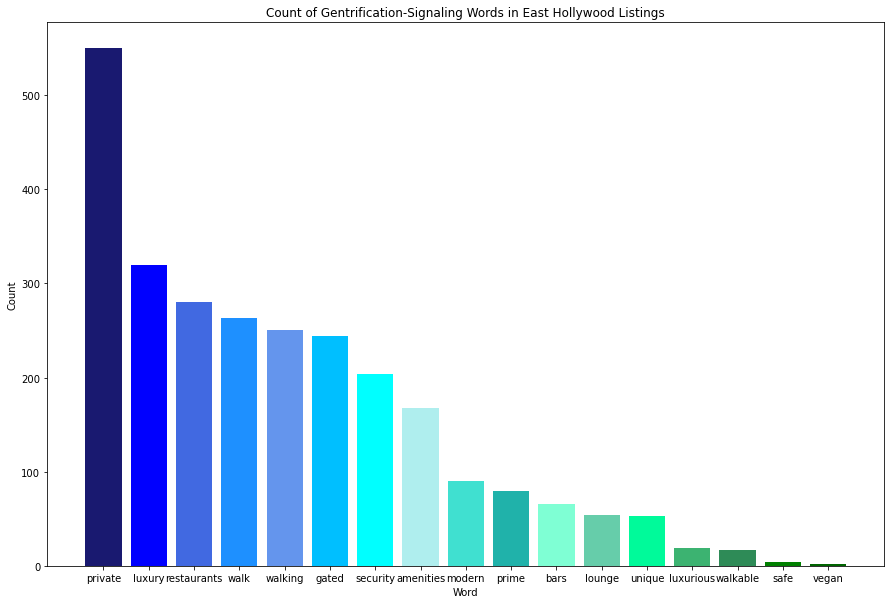

In [85]:
plt.figure(figsize=(15,10))
plt.bar(eholly_buzz['word'], eholly_buzz['word_count'], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")
plt.title("Count of Gentrification-Signaling Words in East Hollywood Listings")
plt.show()

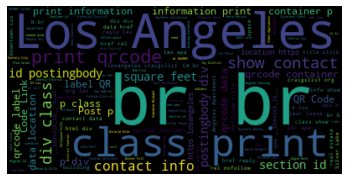

In [88]:
text = mylines_text

# Create and generate a word cloud image:
wordcloud = WordCloud().generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [92]:
eholly_viz = eholly_buzz[['word','word_count']]
eholly_viz

,word,word_count
54,private,550
108,luxury,320
133,restaurants,280
147,walk,263
158,walking,251
163,gated,244
196,security,204
267,amenities,168
515,modern,90
568,prime,79


In [93]:
tuples = [tuple(x) for x in eholly_viz.values]
wordcloud = WordCloud().generate_from_frequencies(dict(tuples))

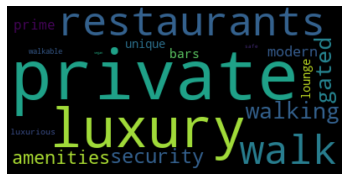

In [94]:
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()